# From Text Clustering to Topic Modeling

## 0. Load data

In [1]:
# Load data from Hugging Face
from datasets import load_dataset
dataset = load_dataset("maartengr/arxiv_nlp")["train"]
# Extract metadata
abstracts = dataset["Abstracts"]
titles = dataset["Titles"]

In [2]:
titles

Column(['Introduction to Arabic Speech Recognition Using CMUSphinx System', 'Arabic Speech Recognition System using CMU-Sphinx4', 'On the Development of Text Input Method - Lessons Learned', 'Network statistics on early English Syntax: Structural criteria', 'Segmentation and Context of Literary and Musical Sequences'])

In [3]:
abstracts[0]

'  In this paper Arabic was investigated from the speech recognition problem\npoint of view. We propose a novel approach to build an Arabic Automated Speech\nRecognition System (ASR). This system is based on the open source CMU Sphinx-4,\nfrom the Carnegie Mellon University. CMU Sphinx is a large-vocabulary;\nspeaker-independent, continuous speech recognition system based on discrete\nHidden Markov Models (HMMs). We build a model using utilities from the\nOpenSource CMU Sphinx. We will demonstrate the possible adaptability of this\nsystem to Arabic voice recognition.\n'

In [4]:
titles[0]

'Introduction to Arabic Speech Recognition Using CMUSphinx System'

## 1. Emddeding

In [5]:
from sentence_transformers import SentenceTransformer
# Create an embedding for each abstract
embedding_model = SentenceTransformer("thenlper/gte-small")
embeddings = embedding_model.encode(abstracts, show_progress_bar=True)

Batches:   0%|          | 0/1405 [00:00<?, ?it/s]

In [6]:
embeddings.shape

(44949, 384)

In [7]:
len(embeddings[0])

384

In [17]:
import numpy as np
# Guardar en un archivo .npy
np.save("embeddings.npy", embeddings)

# Cargar luego
embeddings_loaded = np.load("embeddings.npy")


In [18]:
embeddings_loaded

array([[-8.38182494e-02,  4.16542552e-02,  1.30673414e-02, ...,
         1.21650556e-02, -4.80867643e-03, -4.08200501e-03],
       [-8.71458873e-02,  4.05699350e-02,  1.86350923e-02, ...,
         1.45083414e-02, -4.59623661e-05,  3.18071037e-03],
       [-8.35833475e-02, -1.35176815e-02,  5.27515411e-02, ...,
         6.29818887e-02,  5.36538586e-02, -1.19385347e-02],
       ...,
       [-6.52083084e-02, -4.26614517e-03,  2.71810722e-02, ...,
         3.73920873e-02, -3.73668480e-03, -3.14224744e-03],
       [-5.74976541e-02, -3.33516076e-02, -1.80735649e-03, ...,
        -1.48869092e-02,  1.60427690e-02,  1.20141227e-02],
       [-6.99503347e-02, -7.10754015e-04,  2.52838619e-02, ...,
         4.33816165e-02, -1.36641436e-03,  6.26912806e-04]],
      shape=(44949, 384), dtype=float32)

In [19]:
embeddings

array([[-8.38182494e-02,  4.16542552e-02,  1.30673414e-02, ...,
         1.21650556e-02, -4.80867643e-03, -4.08200501e-03],
       [-8.71458873e-02,  4.05699350e-02,  1.86350923e-02, ...,
         1.45083414e-02, -4.59623661e-05,  3.18071037e-03],
       [-8.35833475e-02, -1.35176815e-02,  5.27515411e-02, ...,
         6.29818887e-02,  5.36538586e-02, -1.19385347e-02],
       ...,
       [-6.52083084e-02, -4.26614517e-03,  2.71810722e-02, ...,
         3.73920873e-02, -3.73668480e-03, -3.14224744e-03],
       [-5.74976541e-02, -3.33516076e-02, -1.80735649e-03, ...,
        -1.48869092e-02,  1.60427690e-02,  1.20141227e-02],
       [-6.99503347e-02, -7.10754015e-04,  2.52838619e-02, ...,
         4.33816165e-02, -1.36641436e-03,  6.26912806e-04]],
      shape=(44949, 384), dtype=float32)

## Dimensionality reduction

In [9]:
from umap.umap_ import UMAP
# We reduce the input embeddings from 384 dimensions to 5 dimensions
umap_model = UMAP(
n_components=5, min_dist=0.0, metric='cosine', random_state=42
)
reduced_embeddings = umap_model.fit_transform(embeddings)

C:\Users\HP\Miniconda3\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [10]:
embeddings

array([[-8.38182494e-02,  4.16542552e-02,  1.30673414e-02, ...,
         1.21650556e-02, -4.80867643e-03, -4.08200501e-03],
       [-8.71458873e-02,  4.05699350e-02,  1.86350923e-02, ...,
         1.45083414e-02, -4.59623661e-05,  3.18071037e-03],
       [-8.35833475e-02, -1.35176815e-02,  5.27515411e-02, ...,
         6.29818887e-02,  5.36538586e-02, -1.19385347e-02],
       ...,
       [-6.52083084e-02, -4.26614517e-03,  2.71810722e-02, ...,
         3.73920873e-02, -3.73668480e-03, -3.14224744e-03],
       [-5.74976541e-02, -3.33516076e-02, -1.80735649e-03, ...,
        -1.48869092e-02,  1.60427690e-02,  1.20141227e-02],
       [-6.99503347e-02, -7.10754015e-04,  2.52838619e-02, ...,
         4.33816165e-02, -1.36641436e-03,  6.26912806e-04]],
      shape=(44949, 384), dtype=float32)

In [11]:
reduced_embeddings

array([[ 9.720056  ,  0.20557487,  0.16478692,  1.1085002 ,  7.44497   ],
       [ 9.718083  ,  0.19900061,  0.17058742,  1.1312877 ,  7.428245  ],
       [ 9.4316025 ,  0.07219358,  0.31092447,  1.864759  ,  7.3120975 ],
       ...,
       [10.402821  , -0.41867486,  0.0721923 ,  4.3083143 ,  8.796101  ],
       [ 9.876026  , -0.50179315,  0.15965173,  3.2123826 ,  7.5113726 ],
       [10.422022  , -0.40101227,  0.06812166,  4.306067  ,  8.779265  ]],
      shape=(44949, 5), dtype=float32)

## Clustering of embeddings 

In [12]:
from hdbscan import HDBSCAN
# We fit the model and extract the clusters
hdbscan_model = HDBSCAN(
min_cluster_size=50, metric="euclidean", cluster_selection_method="eom"
).fit(reduced_embeddings)
clusters = hdbscan_model.labels_
# How many clusters did we generate?
len(set(clusters))

C:\Users\HP\Miniconda3\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\Users\HP\Miniconda3\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


143

In [13]:
titles

Column(['Introduction to Arabic Speech Recognition Using CMUSphinx System', 'Arabic Speech Recognition System using CMU-Sphinx4', 'On the Development of Text Input Method - Lessons Learned', 'Network statistics on early English Syntax: Structural criteria', 'Segmentation and Context of Literary and Musical Sequences'])

In [80]:
import numpy as np
# Print first three documents in cluster 0
cluster = 0
for index in np.where(clusters==cluster)[0:3]:
    print(abstracts[index])

['  This works aims to design a statistical machine translation from English text\nto American Sign Language (ASL). The system is based on Moses tool with some\nmodifications and the results are synthesized through a 3D avatar for\ninterpretation. First, we translate the input text to gloss, a written form of\nASL. Second, we pass the output to the WebSign Plug-in to play the sign.\nContributions of this work are the use of a new couple of language English/ASL\nand an improvement of statistical machine translation based on string matching\nthanks to Jaro-distance.\n', '  Researches on signed languages still strongly dissociate lin- guistic issues\nrelated on phonological and phonetic aspects, and gesture studies for\nrecognition and synthesis purposes. This paper focuses on the imbrication of\nmotion and meaning for the analysis, synthesis and evaluation of sign language\ngestures. We discuss the relevance and interest of a motor theory of perception\nin sign language communication. Ac

In [15]:
import pandas as pd
# Reduce 384-dimensional embeddings to two dimensions for easier visualization
reduced_embeddings = UMAP(
n_components=2, min_dist=0.0, metric="cosine", random_state=42
).fit_transform(embeddings)
# Create dataframe
df = pd.DataFrame(reduced_embeddings, columns=["x", "y"])
df["title"] = titles
df["cluster"] = [str(c) for c in clusters]
# Select outliers and non-outliers (clusters)
to_plot = df.loc[df.cluster != "-1", :]
outliers = df.loc[df.cluster == "-1", :]

C:\Users\HP\Miniconda3\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [25]:
clusters

array([ -1,  -1,  -1, ...,  -1, 129,  -1], shape=(44949,))

In [26]:
# DataFrame completo
df = pd.DataFrame(reduced_embeddings, columns=["x", "y"])
df["title"] = titles
df["cluster"] = [str(c) for c in clusters]

# Clusters válidos
clusters_df = df.loc[df.cluster != "-1", :]

# Outliers
outliers_df = df.loc[df.cluster == "-1", :]


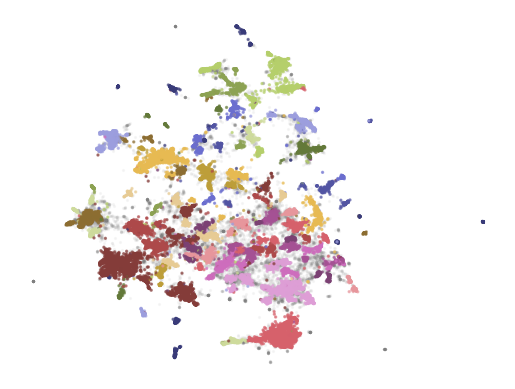

In [27]:
import matplotlib.pyplot as plt

# Outliers en gris
plt.scatter(outliers_df['x'], outliers_df['y'], alpha=0.05, s=2, c='grey')

# Clusters con colores
plt.scatter(
    clusters_df['x'], clusters_df['y'], 
    c=clusters_df['cluster'].astype(int), 
    alpha=0.6, s=2, cmap='tab20b'
)

plt.axis('off')
plt.show()


(np.float64(-8.393370294570923),
 np.float64(11.082963609695435),
 np.float64(-6.404884123802185),
 np.float64(11.368280673027039))

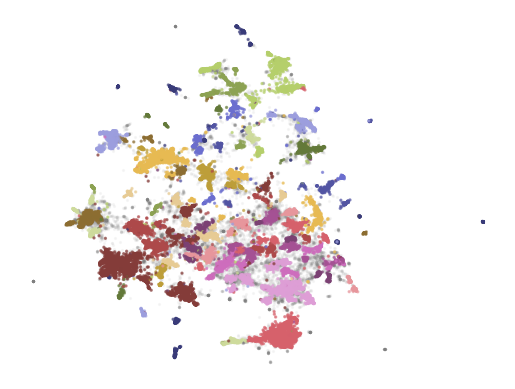

In [28]:
import matplotlib.pyplot as plt
# Plot outliers and non-outliers separately
plt.scatter(outliers.x, outliers.y, alpha=0.05, s=2, c="grey")
plt.scatter(
to_plot.x, to_plot.y, c=to_plot.cluster.astype(int),
alpha=0.6, s=2, cmap="tab20b"
)
plt.axis("off")

## BERTopic

In [149]:
from bertopic import BERTopic
# Train our model with our previously defined models
topic_model = BERTopic(
embedding_model=embedding_model,
umap_model=umap_model,
hdbscan_model=hdbscan_model,
verbose=True
).fit(abstracts, embeddings)

2025-11-21 11:42:40,711 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-11-21 11:43:32,046 - BERTopic - Dimensionality - Completed ✓
2025-11-21 11:43:32,051 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-11-21 11:43:40,748 - BERTopic - Cluster - Completed ✓
2025-11-21 11:43:40,765 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-11-21 11:43:49,614 - BERTopic - Representation - Completed ✓


In [88]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,13280,-1_the_of_and_to,"[the, of, and, to, in, we, for, that, language...",[ High-performance neural language models hav...
1,0,2178,0_question_qa_answer_questions,"[question, qa, answer, questions, answering, a...",[ The ability to ask questions is important i...
2,1,2076,1_speech_asr_recognition_end,"[speech, asr, recognition, end, acoustic, audi...",[ End-to-end models have achieved impressive ...
3,2,1329,2_medical_clinical_biomedical_patient,"[medical, clinical, biomedical, patient, notes...",[ A common practice in the medical industry i...
4,3,957,3_translation_nmt_machine_neural,"[translation, nmt, machine, neural, bleu, engl...",[ Neural machine translation (NMT) becomes a ...
...,...,...,...,...,...
138,137,55,137_mixed_code_sentiment_mixing,"[mixed, code, sentiment, mixing, english, anal...",[ The usage of more than one language in the ...
139,138,55,138_propaganda_techniques_news_subtask,"[propaganda, techniques, news, subtask, detect...",[ Propaganda aims at influencing people's min...
140,139,54,139_materials_chemistry_science_chemical,"[materials, chemistry, science, chemical, mate...",[ The amount of data has growing significance...
141,140,54,140_prompt_prompts_optimization_prompting,"[prompt, prompts, optimization, prompting, llm...",[ Prompt optimization aims to find the best p...


In [33]:
topic_model.get_topic(1)

[('speech', np.float64(0.030146736122575332)),
 ('asr', np.float64(0.019960858631695392)),
 ('recognition', np.float64(0.014256515563495177)),
 ('end', np.float64(0.010880865907002798)),
 ('acoustic', np.float64(0.00999142196113031)),
 ('audio', np.float64(0.007038511650137339)),
 ('speaker', np.float64(0.006956882301443589)),
 ('the', np.float64(0.00686693780317544)),
 ('error', np.float64(0.006774246973219817)),
 ('wer', np.float64(0.0067134484802868))]

## Buscar por papers con un tema de interes

In [51]:
topic_model.find_topics("topic modeling")

([26, -1, 27, 36, 2],
 [np.float32(0.9545064),
  np.float32(0.9115598),
  np.float32(0.908394),
  np.float32(0.90685374),
  np.float32(0.90580326)])

In [34]:
topic_model.find_topics("machine learning")

([-1, 82, 23, 17, 2],
 [np.float32(0.8840444),
  np.float32(0.8779837),
  np.float32(0.8762465),
  np.float32(0.87541896),
  np.float32(0.87391686)])

In [55]:
topic_model.get_topic_info()["Representative_Docs"].iloc[82]

['  Keyphrase generation is a task of identifying a set of phrases that best\nrepre-sent the main topics or themes of a given text. Keyphrases are dividend\nint pre-sent and absent keyphrases. Recent approaches utilizing\nsequence-to-sequence models show effectiveness on absent keyphrase generation.\nHowever, the per-formance is still limited due to the hardness of finding\nabsent keyphrases. In this paper, we propose Keyphrase-Focused BART, which\nexploits the differ-ences between present and absent keyphrase generations, and\nperforms fine-tuning of two separate BART models for present and absent\nkeyphrases. We further show effective approaches of shuffling keyphrases and\ncandidate keyphrase ranking. For absent keyphrases, our Keyphrase-Focused BART\nachieved new state-of-the-art score on F1@5 in two out of five keyphrase\ngen-eration benchmark datasets.\n',
 '  Keyphrases are capable of providing semantic metadata characterizing\ndocuments and producing an overview of the content 

In [37]:
#todos los abstracts con el topic al que pertenencen
topic_model.get_document_info(abstracts)

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,In this paper Arabic was investigated from t...,-1,-1_the_of_and_to,"[the, of, and, to, in, we, for, that, language...",[ High-performance neural language models hav...,the - of - and - to - in - we - for - that - l...,0.00000,False
1,In this paper we present the creation of an ...,-1,-1_the_of_and_to,"[the, of, and, to, in, we, for, that, language...",[ High-performance neural language models hav...,the - of - and - to - in - we - for - that - l...,0.00000,False
2,Intelligent Input Methods (IM) are essential...,-1,-1_the_of_and_to,"[the, of, and, to, in, we, for, that, language...",[ High-performance neural language models hav...,the - of - and - to - in - we - for - that - l...,0.00000,False
3,This paper includes a reflection on the role...,-1,-1_the_of_and_to,"[the, of, and, to, in, we, for, that, language...",[ High-performance neural language models hav...,the - of - and - to - in - we - for - that - l...,0.00000,False
4,"We test a segmentation algorithm, based on t...",19,19_law_frequency_zipf_words,"[law, frequency, zipf, words, of, word, length...","[ In his pioneering research, G. K. Zipf obse...",law - frequency - zipf - words - of - word - l...,0.23974,False
...,...,...,...,...,...,...,...,...
44944,Verbs are sometimes omitted in Japanese sent...,-1,-1_the_of_and_to,"[the, of, and, to, in, we, for, that, language...",[ High-performance neural language models hav...,the - of - and - to - in - we - for - that - l...,0.00000,False
44945,We have developed a new method for Japanese-...,-1,-1_the_of_and_to,"[the, of, and, to, in, we, for, that, language...",[ High-performance neural language models hav...,the - of - and - to - in - we - for - that - l...,0.00000,False
44946,A system is described that uses a mixed-leve...,-1,-1_the_of_and_to,"[the, of, and, to, in, we, for, that, language...",[ High-performance neural language models hav...,the - of - and - to - in - we - for - that - l...,0.00000,False
44947,We present a technique which complements Hid...,113,113_pos_tagging_tagger_taggers,"[pos, tagging, tagger, taggers, part, tags, sp...",[ Unsupervised part of speech (POS) tagging i...,pos - tagging - tagger - taggers - part - tags...,1.00000,False


#### Visualizacion de titulos

In [45]:
import plotly.io as pio
pio.renderers.default = "notebook"     # Para Jupyter Notebook


In [46]:
# Visualize topics and documents
fig = topic_model.visualize_topics()
fig.show()


In [50]:
# Visualize topics and documents
fig = topic_model.visualize_documents(
titles,
reduced_embeddings=reduced_embeddings,
width=1200,
hide_annotations=True
)
# Update fonts of legend for easier visualization
fig.update_layout(font=dict(size=16))

In [47]:
# Visualize barchart with ranked keywords
topic_model.visualize_barchart()

In [154]:
# Visualize relationships between topics
topic_model.visualize_heatmap(n_clusters=30)

In [155]:
# Visualize the potential hierarchical structure of topics
topic_model.visualize_hierarchy()

In [79]:
hierarchical_topics=topic_model.hierarchical_topics(abstracts)
tree = topic_model.get_topic_tree(hierarchical_topics)
print(tree)

100%|████████████████████████████████████████████████████████████████████████████████| 141/141 [02:34<00:00,  1.10s/it]

.
├─Science/Tech____
│    ├─Dialogue state tracking____
│    │    ├─Intent detection and slot filling____
│    │    │    ├─■──Intent detection with semantically similar fine-grained intents is a challenging task. To address it ── Topic: 76
│    │    │    └─■──Intent classification and slot filling____ ── Topic: 79
│    │    └─Dialogue state tracking____
│    │         ├─Dialogue state tracking____
│    │         │    ├─Dialogue state tracking____
│    │         │    │    ├─■──Dialogue act classification____ ── Topic: 129
│    │         │    │    └─Dialogue State Tracking____
│    │         │    │         ├─Science/Tech____
│    │         │    │         │    ├─Knowledge-grounded dialogue____
│    │         │    │         │    │    ├─■──Knowledge-grounded dialogue systems are challenging to build due to the lack of training data and he ── Topic: 86
│    │         │    │         │    │    └─■──Responses to Dialog System Technology Challenges 7 (DSTC7)____ ── Topic: 51
│    │         │    

## Special Lego block

In [59]:
from copy import deepcopy
original_topics = deepcopy(topic_model.topic_representations_)

In [62]:
def topic_differences(model, original_topics, nr_topics=5):
    """Show the differences in topic representations between two models """
    df = pd.DataFrame(columns=["Topic", "Original", "Updated"])
    for topic in range(nr_topics):
    # Extract top 5 words per topic per model
        og_words = " | ".join(list(zip(*original_topics[topic]))[0][:5])
        new_words = " | ".join(list(zip(*model.get_topic(topic)))[0][:5])
        df.loc[len(df)] = [topic, og_words, new_words]
    return df

In [64]:
from bertopic.representation import KeyBERTInspired
# Update our topic representations using KeyBERTInspired
representation_model = KeyBERTInspired()
topic_model.update_topics(abstracts, representation_model=representation_model)
# Show topic differences
topic_differences(topic_model, original_topics)

,Topic,Original,Updated
0,0,question | qa | answer | questions | answering,answering | comprehension | questions | retrie...
1,1,speech | asr | recognition | end | acoustic,phonetic | speech | transcription | language |...
2,2,medical | clinical | biomedical | patient | notes,ehr | clinical | ehrs | nlp | medicine
3,3,translation | nmt | machine | neural | bleu,translating | translation | multilingual | tra...
4,4,summarization | summaries | summary | abstract...,summarization | summarizers | summaries | summ...


In [65]:
from bertopic.representation import MaximalMarginalRelevance
# Update our topic representations to MaximalMarginalRelevance
representation_model = MaximalMarginalRelevance(diversity=0.2)
topic_model.update_topics(abstracts, representation_model=representation_model)
# Show topic differences
topic_differences(topic_model, original_topics)

,Topic,Original,Updated
0,0,question | qa | answer | questions | answering,retrieval | comprehension | knowledge | hop | ...
1,1,speech | asr | recognition | end | acoustic,speech | asr | audio | error | training
2,2,medical | clinical | biomedical | patient | notes,medical | clinical | biomedical | patient | he...
3,3,translation | nmt | machine | neural | bleu,translation | nmt | neural | bleu | parallel
4,4,summarization | summaries | summary | abstract...,summarization | summaries | abstractive | eval...


In [66]:
#labels
from transformers import pipeline
from bertopic.representation import TextGeneration
prompt = """I have a topic that contains the following documents:
[DOCUMENTS]
The topic is described by the following keywords: '[KEYWORDS]'.
Based on the documents and keywords, what is this topic about?"""
# Update our topic representations using Flan-T5
generator = pipeline("text2text-generation", model="google/flan-t5-small")
representation_model = TextGeneration(generator, prompt=prompt, doc_length=50, tokenizer="whitespace")
topic_model.update_topics(abstracts, representation_model=representation_model)
# Show topic differences
topic_differences(topic_model, original_topics)

config.json: 0.00B [00:00, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/308M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/147 [00:00<?, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json: 0.00B [00:00, ?B/s]

Device set to use cpu
100%|████████████████████████████████████████████████████████████████████████████████| 143/143 [03:04<00:00,  1.29s/it]


,Topic,Original,Updated
0,0,question | qa | answer | questions | answering,machine reading | | | |
1,1,speech | asr | recognition | end | acoustic,Science/Tech | | | |
2,2,medical | clinical | biomedical | patient | notes,Science/Tech | | | |
3,3,translation | nmt | machine | neural | bleu,Science/Tech | | | |
4,4,summarization | summaries | summary | abstract...,Text summarization | | | |


In [89]:
# Update our topic representations using Flan-T5
topic = 5 
docs_in_topic = topic_model.get_representative_docs(topic)

# convertir a texto para el prompt
docs_text = "\n".join(docs_in_topic)

# 2. keywords del tópico
keywords = topic_model.get_topic(topic)
keywords_only = ", ".join([w for w, _ in keywords])

# 3. prompt
prompt = """
I have a topic that contains the following documents:
[DOCUMENTS]

The topic is described by the following keywords: '[KEYWORDS]'.
Based on the documents and keywords, what is this topic about?
"""

prompt_filled = (
    prompt.replace("[DOCUMENTS]", docs_text)
          .replace("[KEYWORDS]", keywords_only)
)

print(prompt_filled)



I have a topic that contains the following documents:
  The rise of emergence of social media platforms has fundamentally altered how
people communicate, and among the results of these developments is an increase
in online use of abusive content. Therefore, automatically detecting this
content is essential for banning inappropriate information, and reducing
toxicity and violence on social media platforms. The existing works on hate
speech and offensive language detection produce promising results based on
pre-trained transformer models, however, they considered only the analysis of
abusive content features generated through annotated datasets. This paper
addresses a multi-task joint learning approach which combines external
emotional features extracted from another corpora in dealing with the
imbalanced and scarcity of labeled datasets. Our analysis are using two
well-known Transformer-based models, BERT and mBERT, where the later is used to
address abusive content detection in multi-

In [141]:
#organizar
from bertopic.representation import MaximalMarginalRelevance
from sentence_transformers import SentenceTransformer

embedder = SentenceTransformer("all-mpnet-base-v2")

representation_model = MaximalMarginalRelevance(diversity=0.5)
topic_model.update_topics(abstracts, representation_model=representation_model)


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/571 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/363 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [143]:
topic_differences(topic_model, original_topics)

,Topic,Original,Updated
0,0,question | qa | answer | questions | answering,questions | retrieval | comprehension | knowle...
1,1,speech | asr | recognition | end | acoustic,speech | asr | error | model | training
2,2,medical | clinical | biomedical | patient | notes,clinical | biomedical | patient | healthcare |...
3,3,translation | nmt | machine | neural | bleu,translation | nmt | neural | bleu | parallel
4,4,summarization | summaries | summary | abstract...,summarization | document | extractive | rouge ...
